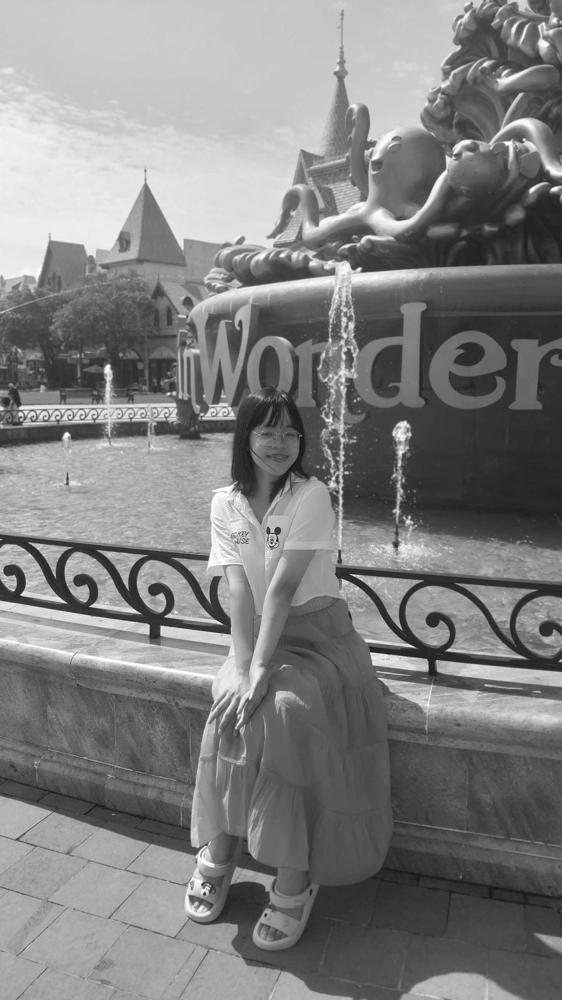

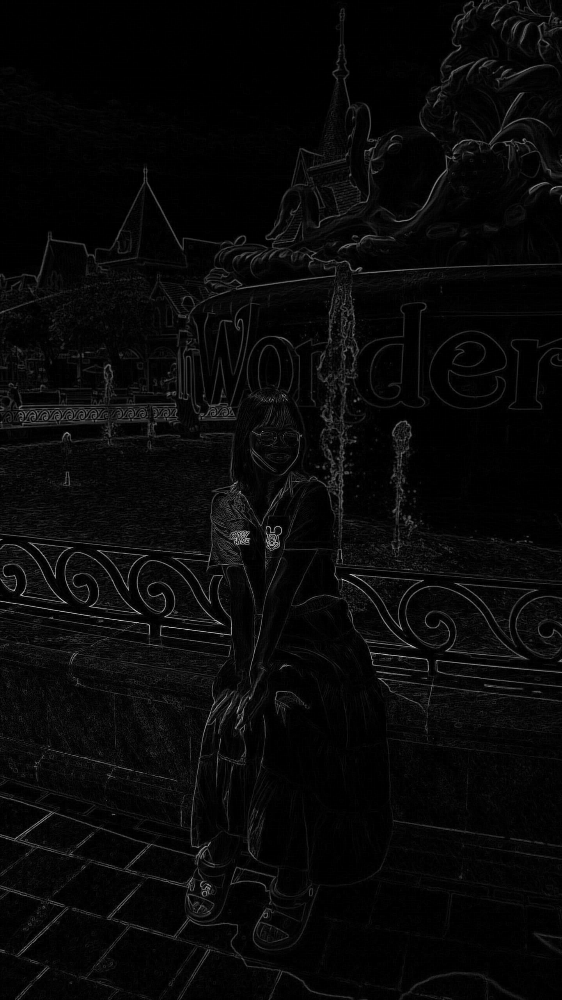

In [89]:
# border
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
img = cv2.imread('/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg', 0)
kernel = np.ones((5, 5), np.uint8)
img_erosion = cv2.erode(img, kernel, iterations=1)
# img_dilation = cv2.dilate(img, kernel, iterations=1)
# cv2_imshow( img_dilation)
border = img-img_erosion
cv2_imshow(img)
cv2_imshow(img- img_erosion)

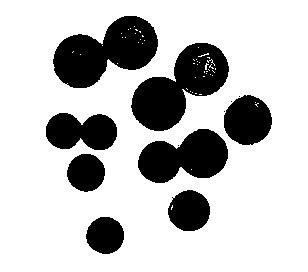

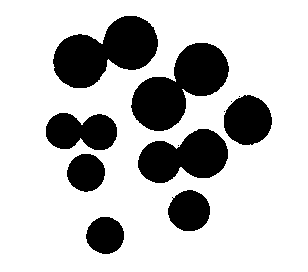

In [155]:
# hole filling
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
hole_tensor_c = cv2.imread("/content/d1tAc.png", cv2.IMREAD_GRAYSCALE)
hole_tensor = cv2.bitwise_not(hole_tensor_c)
cv2_imshow(hole_tensor_c)
X0 = np.zeros_like(hole_tensor, dtype=np.uint8)
X0[hole_tensor.shape[0]//2, hole_tensor.shape[1]//2] = 255
kernel = np.array ([[0,1,0],[1,1,1],[0,1,0]], np.uint8)
prev_X0 = np.zeros_like(X0)
while not np.array_equal(X0, prev_X0):
    prev_X0 = X0.copy()
    X0_dilated = cv2.dilate(X0, kernel, iterations=1)
    X0 = cv2.bitwise_and(X0_dilated, hole_tensor_c)
cv2_imshow(X0)


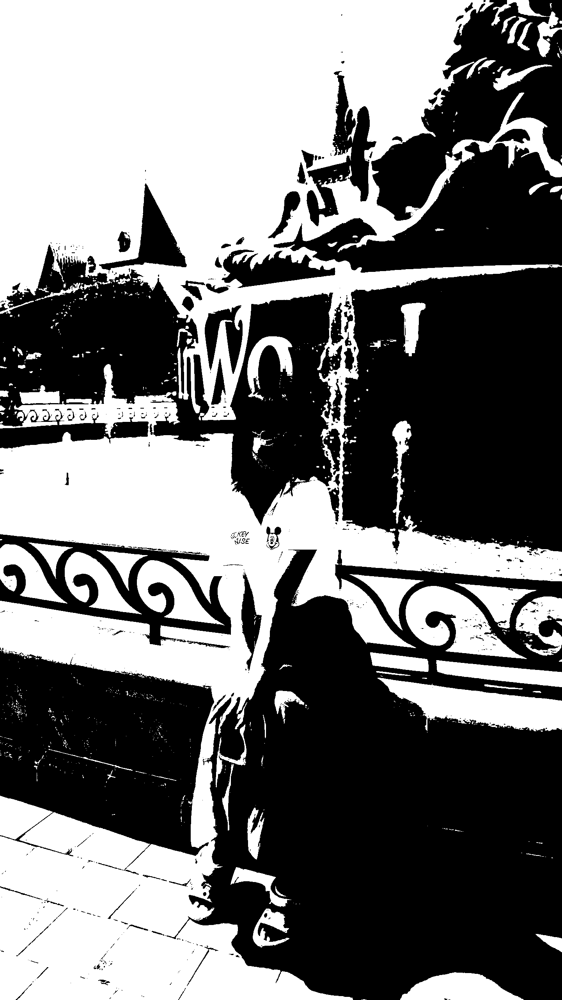

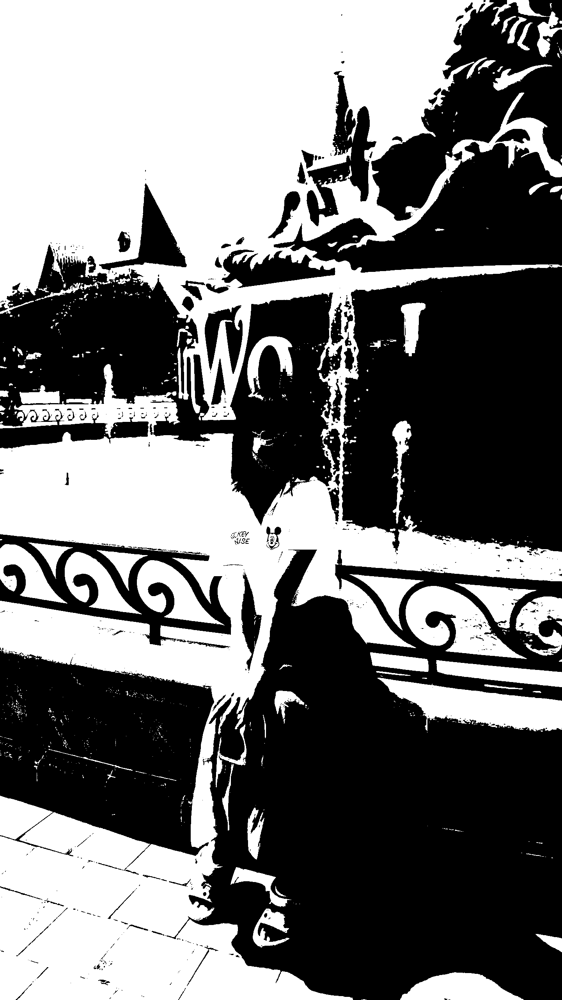

In [150]:
# Extraction of Connected Components
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
connect = cv2.imread ("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, connect = cv2.threshold(connect, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(connect)
kernel = np.ones((3,3), np.uint8)
X0= np.zeros_like(connect, dtype=np.uint8)
X0[connect > 0] = 255
prev_X0 = np.zeros_like(X0)
while not np.array_equal(X0, prev_X0):
  prev_X0 = X0.copy()
  X0_dilated = cv2.dilate(X0, kernel, iterations=1)
  X0 = cv2.bitwise_and(X0_dilated, connect)
cv2_imshow(X0)

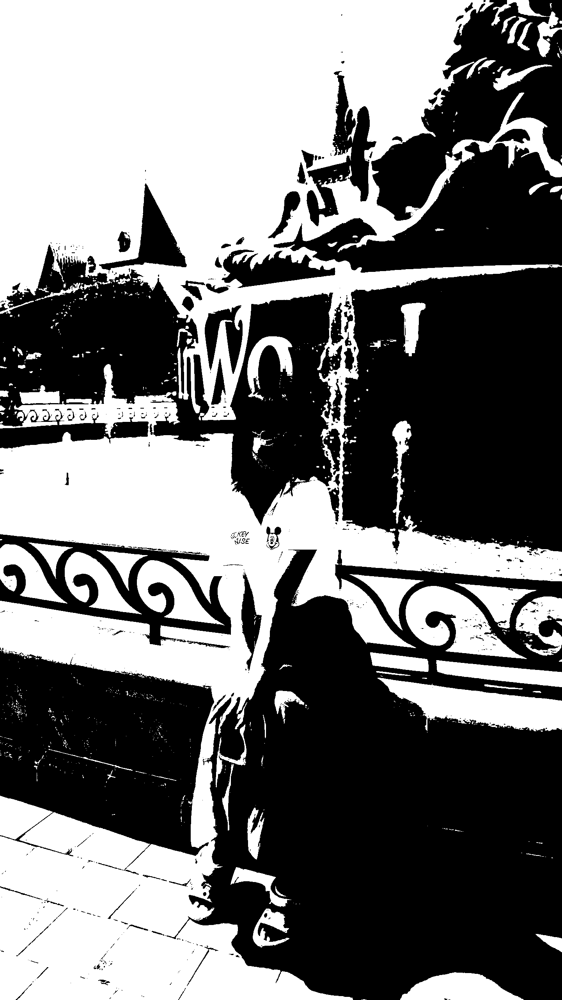

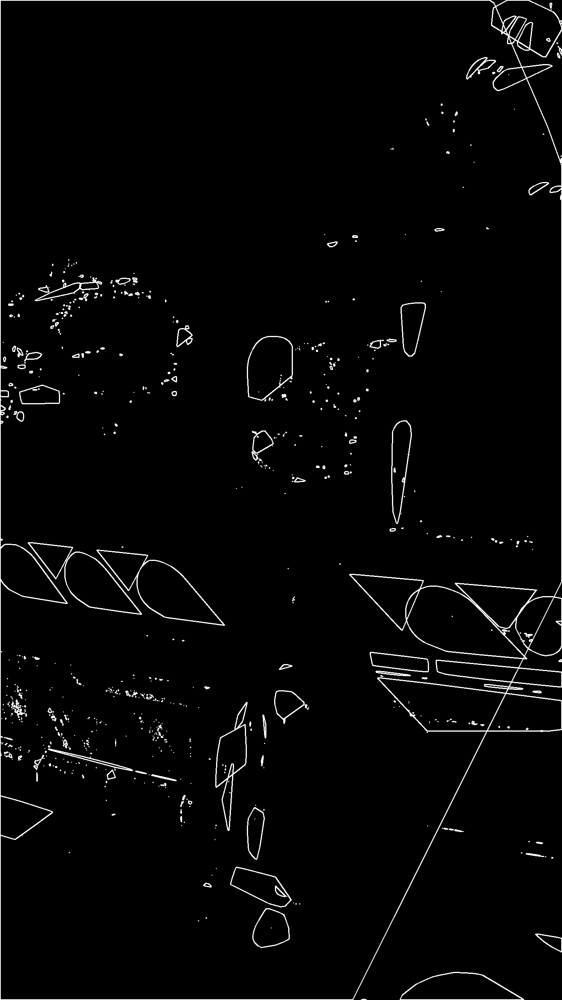

In [167]:
# convex hull
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
hull = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(hull, 127, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
convex_hull_img = np.zeros_like(binary)
for cnt in contours:
    hull_points = cv2.convexHull(cnt)
    cv2.drawContours(convex_hull_img, [hull_points], -1, 255, 2)
cv2_imshow(binary)
cv2_imshow(convex_hull_img)


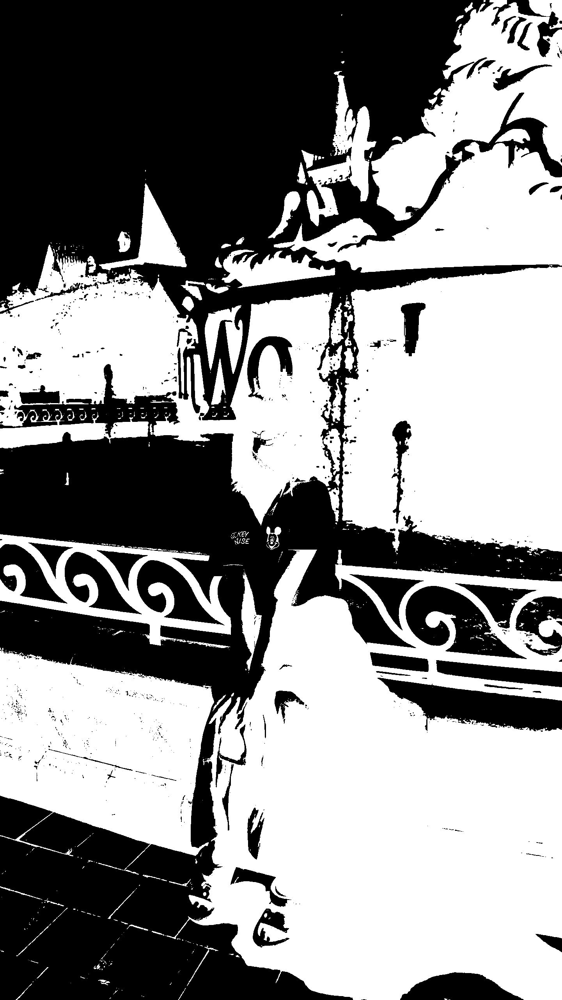

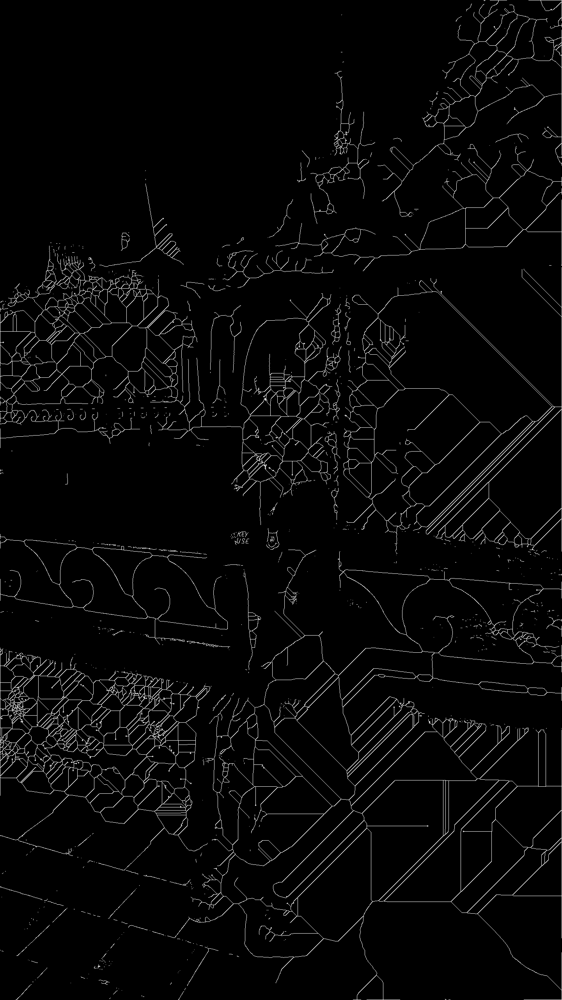

In [168]:
# thinning
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
thinned = cv2.ximgproc.thinning(binary)
cv2_imshow(binary)
cv2_imshow(thinned)


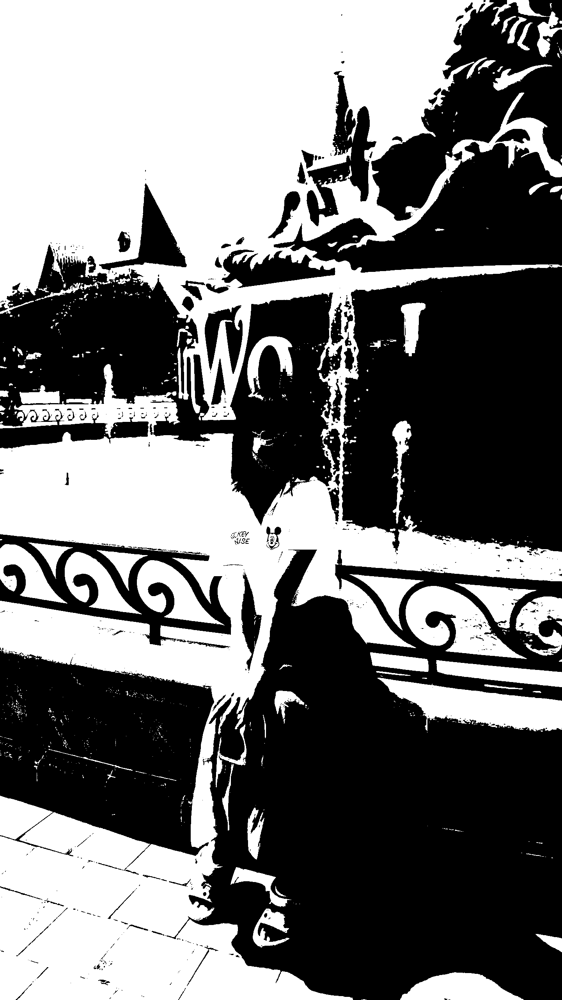

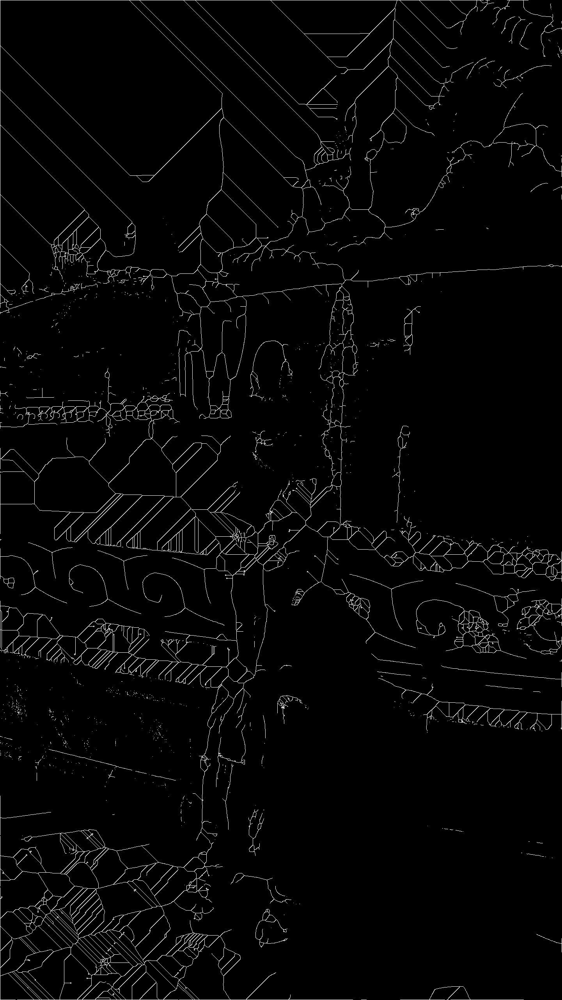

In [170]:
# Thickening
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
binary = cv2.bitwise_not(binary)
thickening = cv2.ximgproc.thinning(binary)
cv2_imshow(binary)
cv2_imshow(thickening)

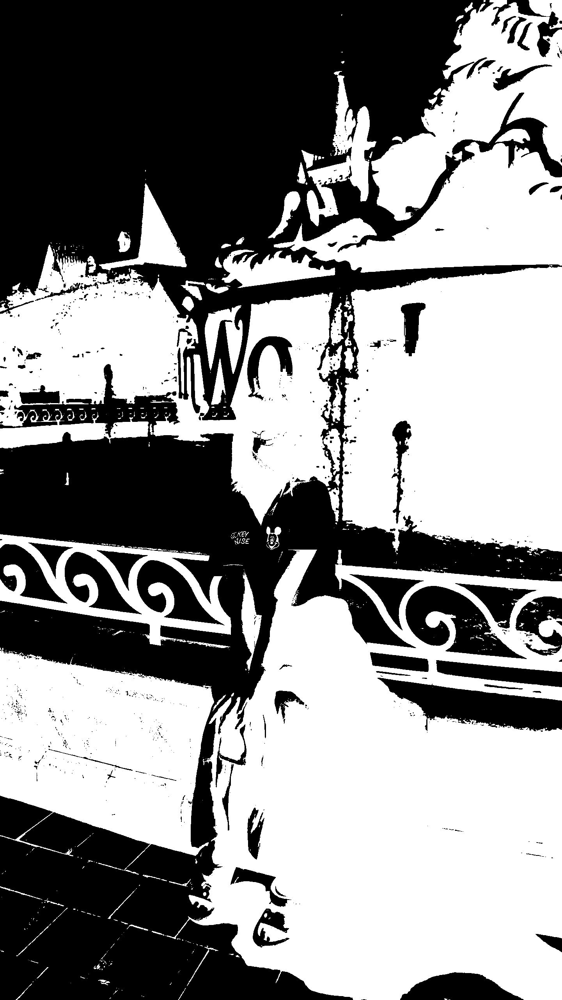

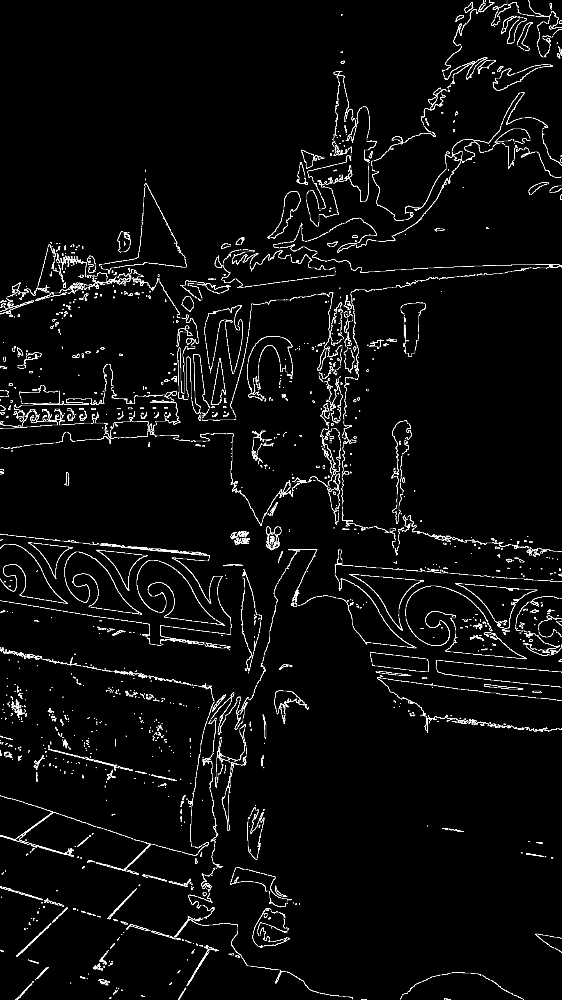

In [171]:
# gradient morphology
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
kernel = np.ones((3,3), np.uint8)
dilation = cv2.dilate (binary, kernel, iterations=1)
erosion = cv2.erode(binary, kernel, iterations=1)
gradient = dilation - erosion
cv2_imshow(binary)
cv2_imshow(gradient)

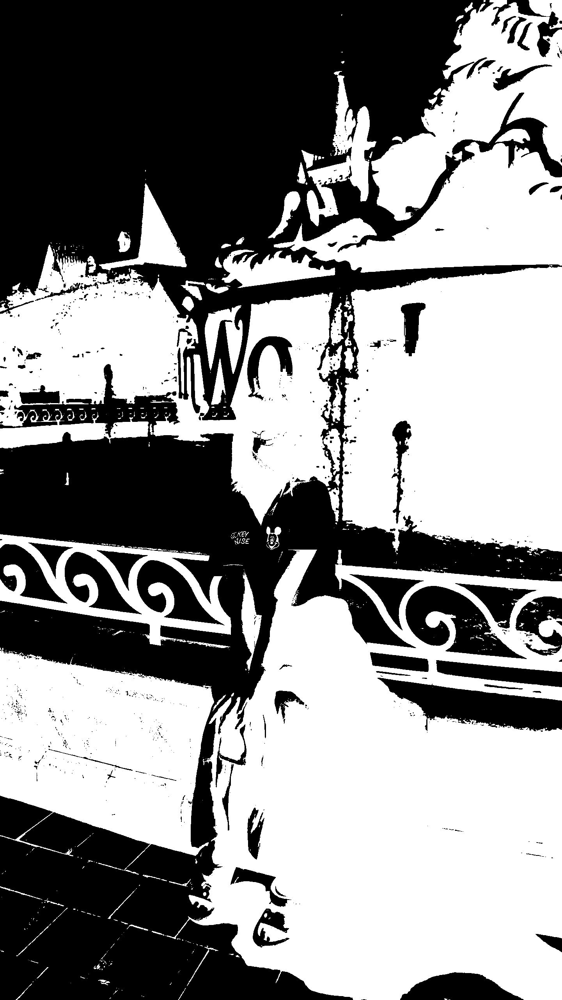

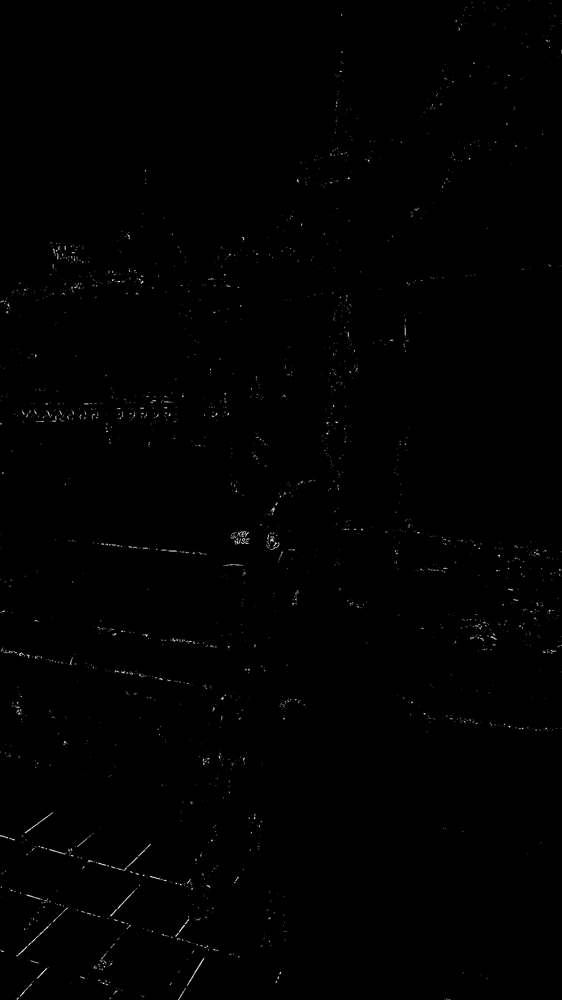

In [173]:
# top hat transform
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
kernel = np.ones((3,3), np.uint8)
erosion = cv2.erode(binary, kernel, iterations=1)
opening = cv2.dilate (erosion, kernel, iterations=1)
tophat = binary - opening
cv2_imshow(binary)
cv2_imshow(tophat)

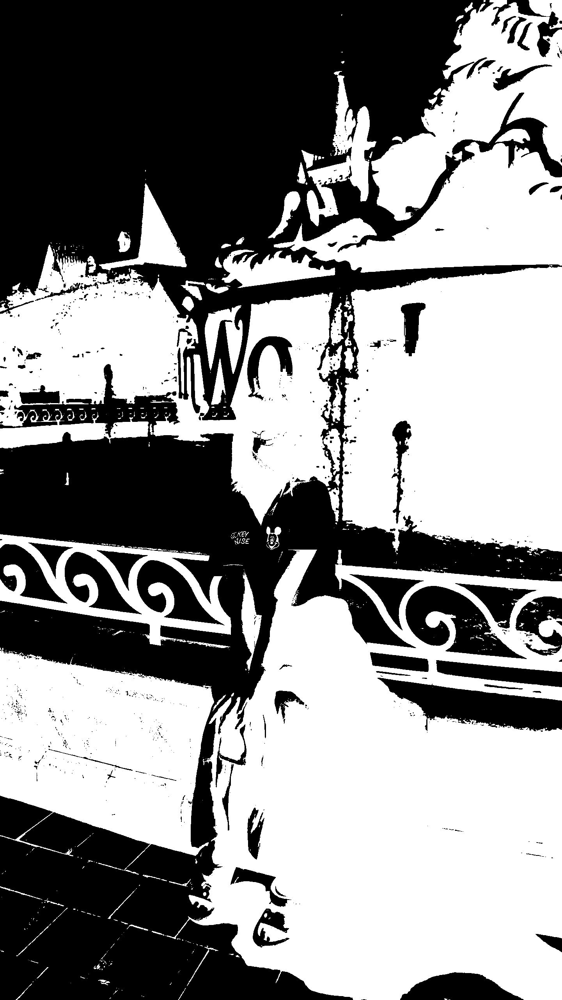

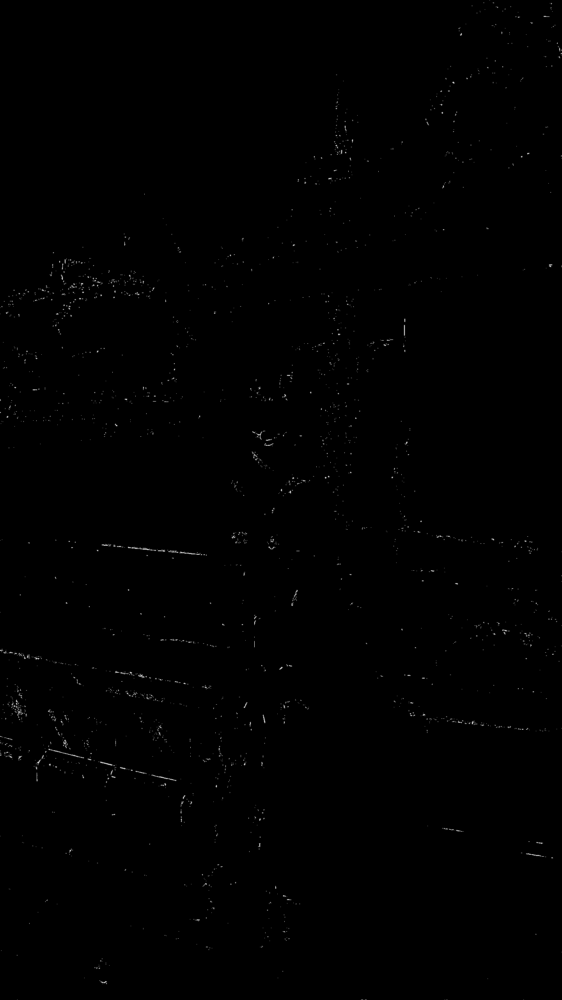

In [174]:
# blackhat
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
image = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
kernel = np.ones((3,3), np.uint8)
dilation = cv2.dilate(binary, kernel, iterations=1)
closing = cv2.erode (dilation, kernel, iterations=1)
blackhat = closing-binary
cv2_imshow(binary)
cv2_imshow(blackhat)

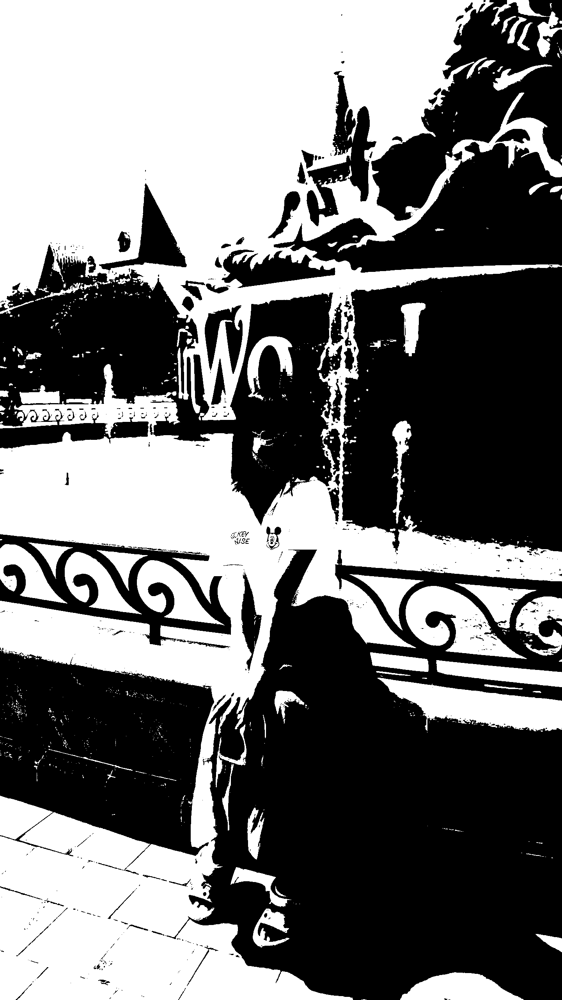

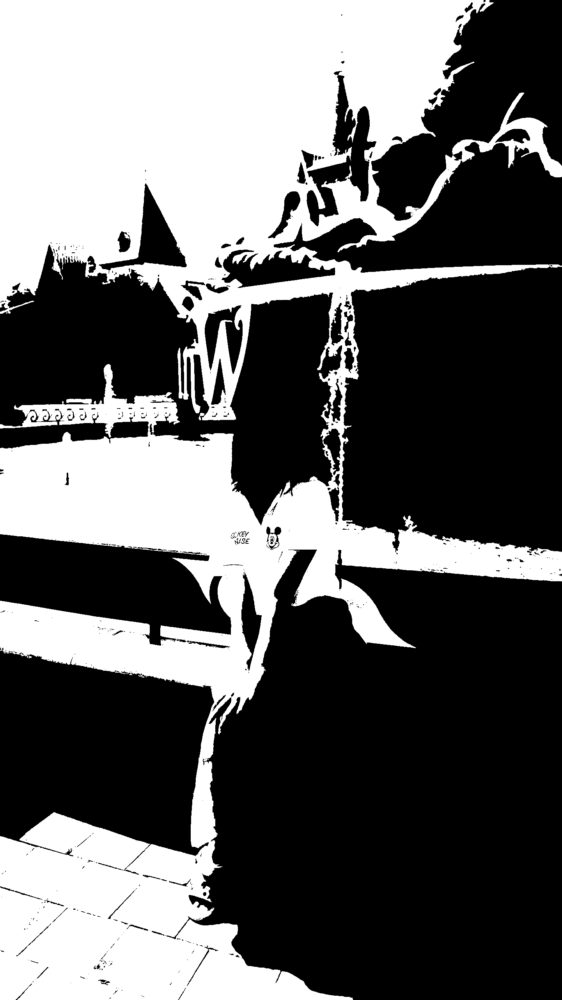

In [175]:
# Morphological Reconstruction
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
mask = cv2.imread("/content/z6264511414557_9aef015014d486f0fad16f602dc28ed4.jpg", cv2.IMREAD_GRAYSCALE)
_, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

marker = np.zeros_like(mask, dtype=np.uint8)
marker[10:50, 10:50] = 255
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
prev_marker = np.zeros_like(marker)
while not np.array_equal(marker, prev_marker):
    prev_marker = marker.copy()
    marker = cv2.dilate(marker, kernel)
    marker = cv2.bitwise_and(marker, mask)
cv2_imshow(mask)
cv2_imshow(marker)
